In [1]:
!pip install datasets

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 480.6/480.6 kB 15.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 179.3/179.3 kB 14.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 16.0 MB/s eta 0:00:00
  Attempting uninstall: fsspec
    Found existing installation: fsspec 2024.10.0
    Uninstalling fsspec-2024.10.0:
      Successfully uninstalled fsspec-2024.10.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
gcsfs 2024.10.0 requires fsspec==2024.10.0, but you have fsspec 2024.9.0 which is incompatible.


# Import Libraries

In [2]:
import os
import tempfile
import numpy as np
import torch
from huggingface_hub import hf_api, HfApi, snapshot_download
from torchvision import transforms
import PIL
from PIL import Image
from functools import partial
import hashlib
from typing import Callable, List, Optional, Union, Any, Dict, Tuple
import copy
from transformers import CLIPFeatureExtractor, CLIPTextModel, CLIPTokenizer
from diffusers import DPMSolverMultistepScheduler, DiffusionPipeline, DDIMScheduler, DDIMInverseScheduler
from diffusers import StableDiffusionPipeline
from diffusers.utils import logging, BaseOutput
from diffusers.models import AutoencoderKL, UNet2DConditionModel
from diffusers.pipelines.stable_diffusion.safety_checker import StableDiffusionSafetyChecker
from diffusers.schedulers import DDIMScheduler,PNDMScheduler, LMSDiscreteScheduler
import requests
from io import BytesIO
from datasets import load_dataset
from tqdm import tqdm

In [3]:
api = hf_api.HfApi()

In [ ]:
FILES_DIR = '/content/Files'
os.makedirs(FILES_DIR, exist_ok=True)

In [5]:
ORG_FILE_PATH = os.path.join(FILES_DIR, 'current_org.txt')

def set_org(org: str):
    os.makedirs(FILES_DIR, exist_ok=True)
    with open(ORG_FILE_PATH, 'w') as file:
        file.write(org)

def get_org() -> str:
    if not os.path.isfile(ORG_FILE_PATH):
        raise ValueError(f"{ORG_FILE_PATH} does not exist. Make sure to run `set_org(org)` first.")
    with open(ORG_FILE_PATH, 'r') as file:
        return file.read().strip()


In [ ]:
set_org("stabilityai")
print("Organization:", get_org())


Organization: stabilityai


# Functions

In [7]:
def _get_pattern(shape, w_pattern='ring', generator=None):
    gt_init = torch.randn(shape, generator=generator)

    if 'rand' in w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2))
        gt_patch[:] = gt_patch[0]
    elif 'zeros' in w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2)) * 0
    elif 'ring' in w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2))

        gt_patch_tmp = gt_patch.clone().detach()
        for i in range(shape[-1] // 2, 0, -1):
            tmp_mask = _circle_mask(gt_init.shape[-1], r=i)
            tmp_mask = torch.tensor(tmp_mask)

            for j in range(gt_patch.shape[1]):
                gt_patch[:, j, tmp_mask] = gt_patch_tmp[0, j, 0, i].item()

    return gt_patch


In [ ]:
def _circle_mask(size=64, r=10, x_offset=0, y_offset=0):
    x0 = y0 = size // 2
    x0 += x_offset
    y0 += y_offset
    y, x = np.ogrid[:size, :size]
    y = y[::-1]

    return ((x - x0)**2 + (y-y0)**2)<= r**2

In [ ]:
def _transform_img(image, target_size=512):
    tform = transforms.Compose(
        [
            transforms.Resize(target_size),
            transforms.CenterCrop(target_size),
            transforms.ToTensor(),
        ]
    )
    image = tform(image)
    return 2.0 * image - 1.0


def load_keys(cache_dir):
    arrays = {}
    for file_name in os.listdir(cache_dir):
        if file_name.endswith('.npy'):
            file_path = os.path.join(cache_dir, file_name)
            arrays[file_name] = np.load(file_path)

    return arrays

In [ ]:
def get_noise(
    shape: Union[torch.Size, List, Tuple], model_hash: str, generator=None
) -> Tuple[torch.Tensor, torch.Tensor, torch.Tensor]:
    w_channel = 0 
    w_radius = 5  
    w_pattern = 'rand'  

    np_mask = _circle_mask(shape[-1], r=w_radius)
    torch_mask = torch.tensor(np_mask)
    w_mask = torch.zeros(shape, dtype=torch.bool)
    w_mask[:, w_channel] = torch_mask

    w_key = _get_pattern(shape, w_pattern=w_pattern, generator=generator)

    init_latents = torch.randn(shape, generator=generator)

    init_latents_fft = torch.fft.fftshift(torch.fft.fft2(init_latents), dim=(-1, -2))
    init_latents_fft[w_mask] = w_key[w_mask].clone()
    init_latents = torch.fft.ifft2(torch.fft.ifftshift(init_latents_fft, dim=(-1, -2))).real
    tensor_bytes = init_latents.numpy().tobytes()
    hash_object = hashlib.sha256(tensor_bytes)
    hex_dig = hash_object.hexdigest()
    os.makedirs(FILES_DIR, exist_ok=True)
    file_name = "_".join([hex_dig, str(w_channel), str(w_radius), w_pattern]) + ".npy"
    file_path = os.path.join(FILES_DIR, file_name)
    np.save(file_path, w_key)

    print(f"Watermark key saved to: {file_path}")
    return init_latents, w_key, w_mask, init_latents_fft


In [ ]:
def detect(image: Union[PIL.Image.Image, torch.Tensor, np.ndarray], pipe, model_hash: str):
    detection_time_num_inference = 50
    threshold = 70
    keys = {}
    
    for file_name in os.listdir(FILES_DIR):
        if file_name.endswith(".npy"):
            file_path = os.path.join(FILES_DIR, file_name)
            keys[file_name] = np.load(file_path)

    curr_scheduler = pipe.scheduler
    pipe.scheduler = DDIMInverseScheduler.from_config(pipe.scheduler.config)

    img = _transform_img(image).unsqueeze(0).to(pipe.unet.dtype).to(pipe.device)
    image_latents = pipe.vae.encode(img).latent_dist.mode() * 0.18215

    inverted_latents = pipe(
        prompt='',
        latents=image_latents,
        guidance_scale=1,
        num_inference_steps=detection_time_num_inference,
        output_type='latent',
    )
    inverted_latents = inverted_latents.images.float().cpu()

    min_dist = float("inf")
    shape = image_latents.shape
    for filename, w_key in keys.items():
        w_channel, w_radius = filename.split(".npy")[0].split("_")[1:3]

        np_mask = _circle_mask(shape[-1], r=int(w_radius))
        torch_mask = torch.tensor(np_mask)
        w_mask = torch.zeros(shape, dtype=torch.bool)
        w_mask[:, int(w_channel)] = torch_mask

        inverted_latents_fft = torch.fft.fftshift(torch.fft.fft2(inverted_latents), dim=(-1, -2))
        dist = torch.abs(inverted_latents_fft[w_mask] - w_key[w_mask]).mean().item()

        min_dist = min(min_dist, dist)

    print(f"Minimum distance for current image: {min_dist}")

    pipe.scheduler = curr_scheduler
    return min_dist <= threshold


# Original vs Watermarked

In [ ]:
diffusion_db = load_dataset('poloclub/diffusiondb', '2m_first_5k', trust_remote_code=True)
prompts = diffusion_db['train']['prompt']


model_id = 'stabilityai/stable-diffusion-2-1-base'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

scheduler = DPMSolverMultistepScheduler.from_pretrained(model_id, subfolder='scheduler')
pipe = DiffusionPipeline.from_pretrained(model_id, scheduler=scheduler, torch_dtype=torch.float16)
pipe = pipe.to(device)

shape = (1, 4, 64, 64)

latents, w_key, w_mask, _ = get_noise(shape, model_id)

latents = latents.to(dtype=torch.float16, device=device)
n_samples = 100
sum1 = 0
sum2 = 0

for i in tqdm(range(n_samples), desc="Processing Images"):
    watermarked_image = pipe(prompt=prompts[i], latents=latents).images[0]
    original_image = pipe(prompt=prompts[i]).images[0]

    is_watermarked1 = detect(original_image, pipe, model_id)
    sum1 += int(is_watermarked1)
    print(f'is_watermarked: {is_watermarked1}')

    is_watermarked2 = detect(watermarked_image, pipe, model_id)
    sum2 += int(is_watermarked2)
    print(f'is_watermarked: {is_watermarked2}')

tp_wmk_wmk = sum2
fn_nwmk_wmk = n_samples - sum2
tn_nwmk_nwmk = n_samples - sum1
fp_wmk_nwmk = sum1

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


README.md:   0%|          | 0.00/25.0k [00:00<?, ?B/s]

diffusiondb.py:   0%|          | 0.00/15.7k [00:00<?, ?B/s]

part-000002.zip:   0%|          | 0.00/581M [00:00<?, ?B/s]

part-000003.zip:   0%|          | 0.00/585M [00:00<?, ?B/s]

part-000004.zip:   0%|          | 0.00/643M [00:00<?, ?B/s]

part-000005.zip:   0%|          | 0.00/585M [00:00<?, ?B/s]

part-000006.zip:   0%|          | 0.00/595M [00:00<?, ?B/s]

metadata.parquet:   0%|          | 0.00/195M [00:00<?, ?B/s]

Generating train split: 0 examples [00:00, ? examples/s]

scheduler/scheduler_config.json:   0%|          | 0.00/346 [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/543 [00:00<?, ?B/s]

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

text_encoder/config.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/911 [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/807 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/553 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Watermark key saved to: /content/Files/7a983e0eddef1b113399a92243c7ac4993aec958332d44ea51ce4cef7e4171a4_0_5_rand.npy


Processing Images:   0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.02079772949219
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   1%|          | 1/100 [00:23<39:11, 23.76s/it]

Minimum distance for current image: 44.494781494140625
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.78257751464844
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   2%|▏         | 2/100 [00:45<36:49, 22.55s/it]

Minimum distance for current image: 42.46875762939453
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.70317077636719
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   3%|▎         | 3/100 [01:08<37:07, 22.97s/it]

Minimum distance for current image: 33.06191635131836
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.53841400146484
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   4%|▍         | 4/100 [01:32<36:59, 23.12s/it]

Minimum distance for current image: 36.924888610839844
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 89.75415802001953
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   5%|▌         | 5/100 [01:56<37:03, 23.40s/it]

Minimum distance for current image: 32.57105255126953
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.1529541015625
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   6%|▌         | 6/100 [02:20<37:06, 23.68s/it]

Minimum distance for current image: 44.494781494140625
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.0418930053711
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   7%|▋         | 7/100 [02:45<37:33, 24.23s/it]

Minimum distance for current image: 37.93241500854492
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.79405212402344
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   8%|▊         | 8/100 [03:10<37:29, 24.45s/it]

Minimum distance for current image: 36.116920471191406
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.12680053710938
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:   9%|▉         | 9/100 [03:35<37:10, 24.51s/it]

Minimum distance for current image: 33.876853942871094
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.32360076904297
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  10%|█         | 10/100 [03:59<36:47, 24.53s/it]

Minimum distance for current image: 46.06265640258789
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.5338134765625
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  11%|█         | 11/100 [04:24<36:26, 24.56s/it]

Minimum distance for current image: 37.93241500854492
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 97.76235961914062
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  12%|█▏        | 12/100 [04:49<36:04, 24.60s/it]

Minimum distance for current image: 37.268978118896484
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.34066772460938
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  13%|█▎        | 13/100 [05:13<35:45, 24.66s/it]

Minimum distance for current image: 44.098731994628906
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.7068862915039
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  14%|█▍        | 14/100 [05:38<35:25, 24.72s/it]

Minimum distance for current image: 37.93241500854492
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 91.9874267578125
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  15%|█▌        | 15/100 [06:03<35:05, 24.77s/it]

Minimum distance for current image: 36.61265182495117
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.77606201171875
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  16%|█▌        | 16/100 [06:28<34:43, 24.81s/it]

Minimum distance for current image: 49.01337432861328
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.79618835449219
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  17%|█▋        | 17/100 [06:53<34:20, 24.82s/it]

Minimum distance for current image: 41.00546646118164
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.937255859375
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  18%|█▊        | 18/100 [07:18<33:54, 24.81s/it]

Minimum distance for current image: 36.51260757446289
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.6848373413086
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  19%|█▉        | 19/100 [07:43<33:27, 24.79s/it]

Minimum distance for current image: 49.01337432861328
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.47765350341797
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  20%|██        | 20/100 [08:07<32:58, 24.74s/it]

Minimum distance for current image: 38.450531005859375
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 87.25566101074219
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  21%|██        | 21/100 [08:32<32:31, 24.70s/it]

Minimum distance for current image: 40.9397087097168
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.03754425048828
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  22%|██▏       | 22/100 [08:56<32:06, 24.69s/it]

Minimum distance for current image: 42.93040084838867
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.15807342529297
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  23%|██▎       | 23/100 [09:21<31:42, 24.71s/it]

Minimum distance for current image: 53.130191802978516
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 89.55538940429688
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  24%|██▍       | 24/100 [09:46<31:18, 24.72s/it]

Minimum distance for current image: 47.185447692871094
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 96.00039672851562
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  25%|██▌       | 25/100 [10:11<30:55, 24.74s/it]

Minimum distance for current image: 28.979928970336914
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.66941833496094
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  26%|██▌       | 26/100 [10:35<30:30, 24.74s/it]

Minimum distance for current image: 49.60763168334961
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.5776138305664
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  27%|██▋       | 27/100 [11:00<30:04, 24.72s/it]

Minimum distance for current image: 47.185447692871094
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 97.7721939086914
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  28%|██▊       | 28/100 [11:25<29:40, 24.72s/it]

Minimum distance for current image: 43.034488677978516
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.64139556884766
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  29%|██▉       | 29/100 [11:50<29:16, 24.74s/it]

Minimum distance for current image: 39.27865982055664
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 95.77913665771484
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  30%|███       | 30/100 [12:14<28:51, 24.74s/it]

Minimum distance for current image: 32.853431701660156
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 93.69805145263672
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  31%|███       | 31/100 [12:39<28:27, 24.75s/it]

Minimum distance for current image: 39.30951690673828
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.68871307373047
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  32%|███▏      | 32/100 [13:04<28:03, 24.75s/it]

Minimum distance for current image: 38.653564453125
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.64503479003906
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  33%|███▎      | 33/100 [13:29<27:38, 24.75s/it]

Minimum distance for current image: 46.88085174560547
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.47682189941406
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  34%|███▍      | 34/100 [13:53<27:14, 24.76s/it]

Minimum distance for current image: 49.162960052490234
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.98734283447266
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  35%|███▌      | 35/100 [14:18<26:49, 24.76s/it]

Minimum distance for current image: 52.094547271728516
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.60760498046875
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  36%|███▌      | 36/100 [14:43<26:26, 24.79s/it]

Minimum distance for current image: 41.3591194152832
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.42239379882812
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  37%|███▋      | 37/100 [15:08<26:01, 24.79s/it]

Minimum distance for current image: 61.35911560058594
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.81584167480469
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  38%|███▊      | 38/100 [15:33<25:38, 24.82s/it]

Minimum distance for current image: 42.55477523803711
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.96575927734375
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  39%|███▉      | 39/100 [15:58<25:14, 24.83s/it]

Minimum distance for current image: 43.66539764404297
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.09284973144531
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  40%|████      | 40/100 [16:22<24:49, 24.82s/it]

Minimum distance for current image: 64.90911102294922
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.44646453857422
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  41%|████      | 41/100 [16:47<24:24, 24.82s/it]

Minimum distance for current image: 37.90170669555664
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.51532745361328
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  42%|████▏     | 42/100 [17:12<23:59, 24.82s/it]

Minimum distance for current image: 42.55477523803711
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.08871459960938
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  43%|████▎     | 43/100 [17:37<23:34, 24.81s/it]

Minimum distance for current image: 41.86455154418945
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 92.90892028808594
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  44%|████▍     | 44/100 [18:02<23:09, 24.82s/it]

Minimum distance for current image: 39.87605667114258
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 90.64855194091797
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  45%|████▌     | 45/100 [18:26<22:44, 24.82s/it]

Minimum distance for current image: 41.86455154418945
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.18743896484375
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  46%|████▌     | 46/100 [18:51<22:19, 24.81s/it]

Minimum distance for current image: 36.374908447265625
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.73286437988281
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  47%|████▋     | 47/100 [19:16<21:53, 24.79s/it]

Minimum distance for current image: 43.741886138916016
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.47661590576172
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  48%|████▊     | 48/100 [19:41<21:28, 24.77s/it]

Minimum distance for current image: 42.55477523803711
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 68.03829956054688
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  49%|████▉     | 49/100 [20:05<21:02, 24.75s/it]

Minimum distance for current image: 36.762325286865234
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.48396301269531
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  50%|█████     | 50/100 [20:30<20:38, 24.77s/it]

Minimum distance for current image: 40.33501052856445
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 96.18051147460938
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  51%|█████     | 51/100 [20:55<20:14, 24.78s/it]

Minimum distance for current image: 42.55477523803711
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.84893798828125
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  52%|█████▏    | 52/100 [21:20<19:49, 24.78s/it]

Minimum distance for current image: 40.469215393066406
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.17898559570312
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  53%|█████▎    | 53/100 [21:45<19:24, 24.77s/it]

Minimum distance for current image: 41.192474365234375
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.20973205566406
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  54%|█████▍    | 54/100 [22:09<18:58, 24.75s/it]

Minimum distance for current image: 41.86455154418945
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.94966125488281
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  55%|█████▌    | 55/100 [22:34<18:33, 24.74s/it]

Minimum distance for current image: 42.55477523803711
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.45855712890625
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  56%|█████▌    | 56/100 [22:59<18:08, 24.74s/it]

Minimum distance for current image: 40.52234649658203
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 87.41486358642578
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  57%|█████▋    | 57/100 [23:24<17:44, 24.75s/it]

Minimum distance for current image: 45.534690856933594
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.4580307006836
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  58%|█████▊    | 58/100 [23:48<17:19, 24.75s/it]

Minimum distance for current image: 40.52234649658203
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.015380859375
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  59%|█████▉    | 59/100 [24:13<16:54, 24.75s/it]

Minimum distance for current image: 40.142398834228516
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 87.81743621826172
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  60%|██████    | 60/100 [24:38<16:29, 24.73s/it]

Minimum distance for current image: 41.34168243408203
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 87.66282653808594
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  61%|██████    | 61/100 [25:02<16:04, 24.73s/it]

Minimum distance for current image: 44.14257049560547
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.10933685302734
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  62%|██████▏   | 62/100 [25:27<15:40, 24.74s/it]

Minimum distance for current image: 37.01409149169922
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.8133544921875
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  63%|██████▎   | 63/100 [25:52<15:16, 24.76s/it]

Minimum distance for current image: 44.14257049560547
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.8632583618164
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  64%|██████▍   | 64/100 [26:17<14:50, 24.75s/it]

Minimum distance for current image: 42.889251708984375
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 87.72002410888672
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  65%|██████▌   | 65/100 [26:41<14:25, 24.73s/it]

Minimum distance for current image: 40.52234649658203
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.17437744140625
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  66%|██████▌   | 66/100 [27:06<14:00, 24.72s/it]

Minimum distance for current image: 34.764320373535156
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.77759552001953
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  67%|██████▋   | 67/100 [27:31<13:35, 24.72s/it]

Minimum distance for current image: 32.29442596435547
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.27306365966797
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  68%|██████▊   | 68/100 [27:56<13:10, 24.71s/it]

Minimum distance for current image: 45.534690856933594
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.00591278076172
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  69%|██████▉   | 69/100 [28:20<12:45, 24.70s/it]

Minimum distance for current image: 31.512990951538086
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.13137817382812
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  70%|███████   | 70/100 [28:45<12:21, 24.71s/it]

Minimum distance for current image: 36.34159851074219
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 93.01417541503906
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  71%|███████   | 71/100 [29:10<11:56, 24.71s/it]

Minimum distance for current image: 40.315433502197266
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.04844665527344
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  72%|███████▏  | 72/100 [29:34<11:32, 24.73s/it]

Minimum distance for current image: 36.85380935668945
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 87.77963256835938
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  73%|███████▎  | 73/100 [29:59<11:08, 24.74s/it]

Minimum distance for current image: 42.777801513671875
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.5277328491211
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  74%|███████▍  | 74/100 [30:24<10:43, 24.75s/it]

Minimum distance for current image: 36.85380935668945
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.31922912597656
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  75%|███████▌  | 75/100 [30:49<10:18, 24.76s/it]

Minimum distance for current image: 36.34159851074219
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.92816925048828
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  76%|███████▌  | 76/100 [31:13<09:53, 24.74s/it]

Minimum distance for current image: 46.90603256225586
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.30343627929688
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  77%|███████▋  | 77/100 [31:38<09:29, 24.74s/it]

Minimum distance for current image: 35.42344665527344
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.75829315185547
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  78%|███████▊  | 78/100 [32:03<09:04, 24.74s/it]

Minimum distance for current image: 29.122526168823242
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.38883209228516
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  79%|███████▉  | 79/100 [32:28<08:39, 24.72s/it]

Minimum distance for current image: 40.40143585205078
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 96.678955078125
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  80%|████████  | 80/100 [32:52<08:14, 24.72s/it]

Minimum distance for current image: 46.90603256225586
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.62693786621094
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  81%|████████  | 81/100 [33:17<07:49, 24.71s/it]

Minimum distance for current image: 38.606510162353516
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.60557556152344
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  82%|████████▏ | 82/100 [33:42<07:24, 24.70s/it]

Minimum distance for current image: 43.4641227722168
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.07933807373047
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  83%|████████▎ | 83/100 [34:06<06:59, 24.69s/it]

Minimum distance for current image: 38.606510162353516
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.7046890258789
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  84%|████████▍ | 84/100 [34:31<06:35, 24.71s/it]

Minimum distance for current image: 43.78520584106445
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 90.4659194946289
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  85%|████████▌ | 85/100 [34:56<06:10, 24.73s/it]

Minimum distance for current image: 37.73373031616211
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.76070404052734
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  86%|████████▌ | 86/100 [35:21<05:46, 24.74s/it]

Minimum distance for current image: 36.76791000366211
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.05860900878906
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  87%|████████▋ | 87/100 [35:45<05:21, 24.74s/it]

Minimum distance for current image: 44.24462127685547
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.7713394165039
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  88%|████████▊ | 88/100 [36:10<04:57, 24.76s/it]

Minimum distance for current image: 38.62239456176758
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.6565170288086
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  89%|████████▉ | 89/100 [36:35<04:32, 24.78s/it]

Minimum distance for current image: 36.71928405761719
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 94.5174789428711
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  90%|█████████ | 90/100 [37:00<04:07, 24.79s/it]

Minimum distance for current image: 41.790931701660156
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.45767211914062
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  91%|█████████ | 91/100 [37:25<03:42, 24.77s/it]

Minimum distance for current image: 36.76791000366211
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.70232391357422
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  92%|█████████▏| 92/100 [37:49<03:18, 24.77s/it]

Minimum distance for current image: 40.112281799316406
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.28901672363281
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  93%|█████████▎| 93/100 [38:14<02:53, 24.78s/it]

Minimum distance for current image: 41.89637756347656
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 87.565673828125
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  94%|█████████▍| 94/100 [38:39<02:28, 24.79s/it]

Minimum distance for current image: 38.62239456176758
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.33634948730469
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  95%|█████████▌| 95/100 [39:04<02:03, 24.78s/it]

Minimum distance for current image: 30.03276252746582
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.4129867553711
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  96%|█████████▌| 96/100 [39:28<01:39, 24.78s/it]

Minimum distance for current image: 41.046539306640625
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.58474731445312
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  97%|█████████▋| 97/100 [39:53<01:14, 24.78s/it]

Minimum distance for current image: 38.09449768066406
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 91.9322738647461
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  98%|█████████▊| 98/100 [40:18<00:49, 24.80s/it]

Minimum distance for current image: 36.95698165893555
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.98235321044922
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images:  99%|█████████▉| 99/100 [40:43<00:24, 24.81s/it]

Minimum distance for current image: 30.2455997467041
is_watermarked: True


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.1904296875
is_watermarked: False


  0%|          | 0/50 [00:00<?, ?it/s]

Processing Images: 100%|██████████| 100/100 [41:08<00:00, 24.68s/it]

Minimum distance for current image: 36.62217712402344
is_watermarked: True


In [ ]:
print(f"True Positives: {tp_wmk_wmk}")
print(f"False Negatives: {fn_nwmk_wmk}")
print(f"True Negatives: {tn_nwmk_nwmk}")
print(f"False Positives: {fp_wmk_nwmk}")

True Positives: 100
False Negatives: 0
True Negatives: 99
False Positives: 1


In [14]:
acc_gen = (tp_wmk_wmk+tn_nwmk_nwmk)/(tp_wmk_wmk+tn_nwmk_nwmk+fp_wmk_nwmk+fn_nwmk_wmk)
precision = tp_wmk_wmk/(tp_wmk_wmk+fp_wmk_nwmk)
recall = tp_wmk_wmk/(tp_wmk_wmk+fn_nwmk_wmk)

print(acc_gen, precision, recall)

0.995 0.9900990099009901 1.0


# Real Images

In [ ]:
coco_dataset = load_dataset("detection-datasets/coco", split="train", streaming=True)
shuffled = coco_dataset.shuffle(seed=42)
subset = shuffled.take(500)
data = list(subset)

images = []
for i in range(len(data)):
  images.append(data[i]['image'])

print(images[0])

sum2 = 0

for j in range(100):
  is_watermarked = detect(images[j], pipe, model_id)
  sum2 += int(is_watermarked)
  #print(f'is_watermarked: {is_watermarked}')

print(100-sum2/10)
acc = 100-(sum2/10)




README.md:   0%|          | 0.00/58.0 [00:00<?, ?B/s]

Resolving data files:   0%|          | 0/40 [00:00<?, ?it/s]

dataset_infos.json:   0%|          | 0.00/2.10k [00:00<?, ?B/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


<PIL.JpegImagePlugin.JpegImageFile image mode=RGB size=640x366 at 0x787109FCCAC0>


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.35734558105469


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.27079010009766


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.97823333740234


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.76853942871094


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.63075256347656


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.716064453125


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.09911346435547


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.0961685180664


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.23577880859375


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.15807342529297


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.96131896972656


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.10160064697266


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.02672576904297


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.66341400146484


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.5753402709961


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.2208023071289


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 95.71763610839844


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.85197448730469


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.57599639892578


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.59200286865234


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 90.9253921508789


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.06103515625


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.86115264892578


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 93.32014465332031


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.29231262207031


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 94.98531341552734


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.936767578125


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 89.96639251708984


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.84303283691406


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.37652587890625


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.0103530883789


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.02425384521484


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.67340850830078


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.34098815917969


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 96.4464111328125


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.6463851928711


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 91.04924774169922


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.19623565673828


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 89.84711456298828


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.6861801147461


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.36502075195312


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 92.89628601074219


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.1201171875


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 72.83758544921875


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.94656372070312


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.13253784179688


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.76486206054688


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 75.4759750366211


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.5545425415039


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.8531494140625


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.21039581298828


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 94.89141845703125


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 89.38914489746094


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.5593032836914


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 91.75874328613281


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 87.44015502929688


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 91.2577133178711


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 78.9720687866211


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.20848083496094


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.40806579589844


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 71.52877044677734


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 89.07646179199219


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.13607025146484


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.41913604736328


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 89.94149017333984


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.16040802001953


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.69364929199219


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.28302001953125


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.5542221069336


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.2040786743164


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 87.45551300048828


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.93186950683594


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.02758026123047


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.6893539428711


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.23310852050781


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.33042907714844


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.72845458984375


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 73.77462005615234


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 74.80376434326172


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.38025665283203


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 79.20368957519531


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 83.9348373413086


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 89.29114532470703


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.7645492553711


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.29623413085938


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.33724975585938


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.89839172363281


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 76.87578582763672


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.7425308227539


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 88.72797393798828


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.98532104492188


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 84.62850189208984


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 77.37854766845703


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 85.04267883300781


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 80.08819580078125


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.06121063232422


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 82.8076171875


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 86.06761169433594


  0%|          | 0/50 [00:00<?, ?it/s]

The config attributes {'skip_prk_steps': True} were passed to DDIMInverseScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


Minimum distance for current image: 81.94202423095703


  0%|          | 0/50 [00:00<?, ?it/s]

Minimum distance for current image: 82.04564666748047
100.0


# Visualization

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

Processing prompt 1: a renaissance portrait of dwayne johnson, art in the style of rembrandt!! intricate. ultra detailed, oil on canvas, wet - on - wet technique, pay attention to facial details, highly realistic, cinematic lightning, intricate textures, illusionistic detail, 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

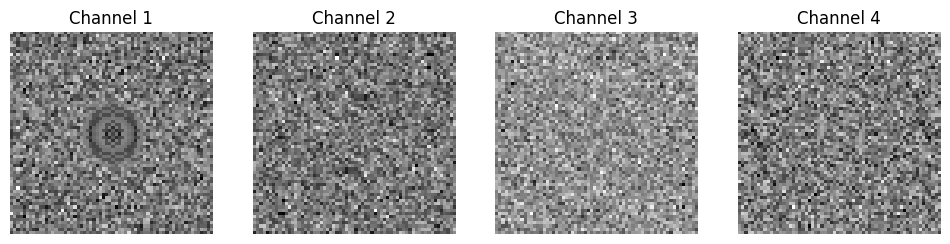

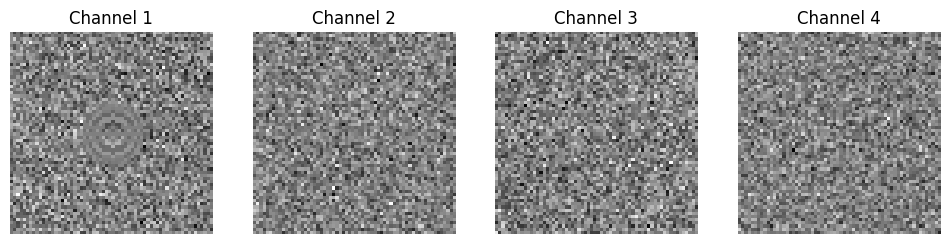

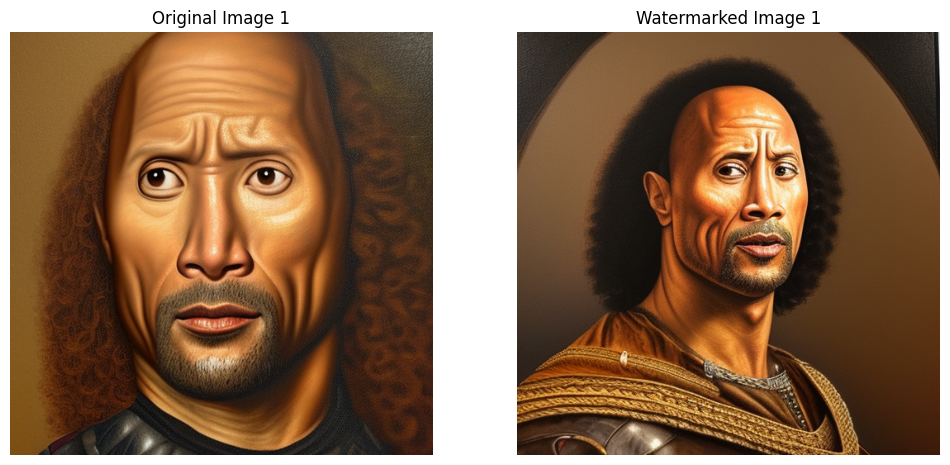

  0%|          | 0/50 [00:00<?, ?it/s]

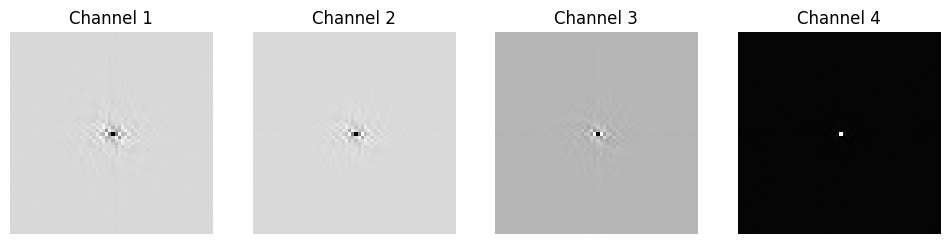

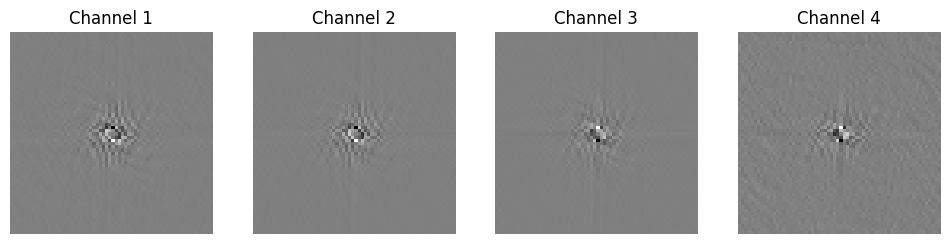

 10%|█         | 1/10 [00:48<07:15, 48.34s/it]

Sample 1/2 processed
Processing prompt 2: portrait of a dancing eagle woman, beautiful blonde haired lakota sioux goddess, intricate, highly detailed art by james jean, ray tracing, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm and greg rutkowski and alphonse mucha, vladimir kush, giger, 8 k 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

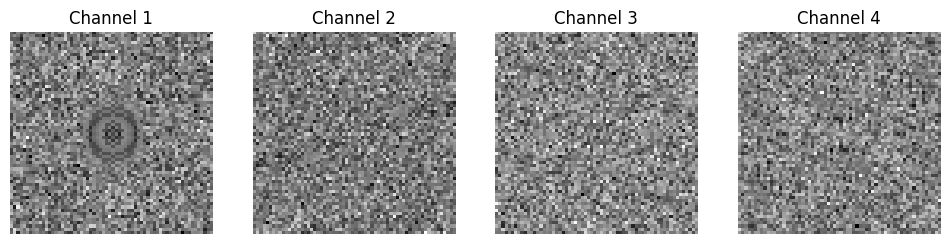

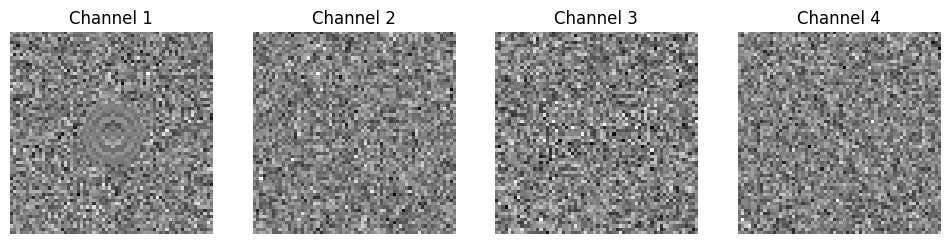

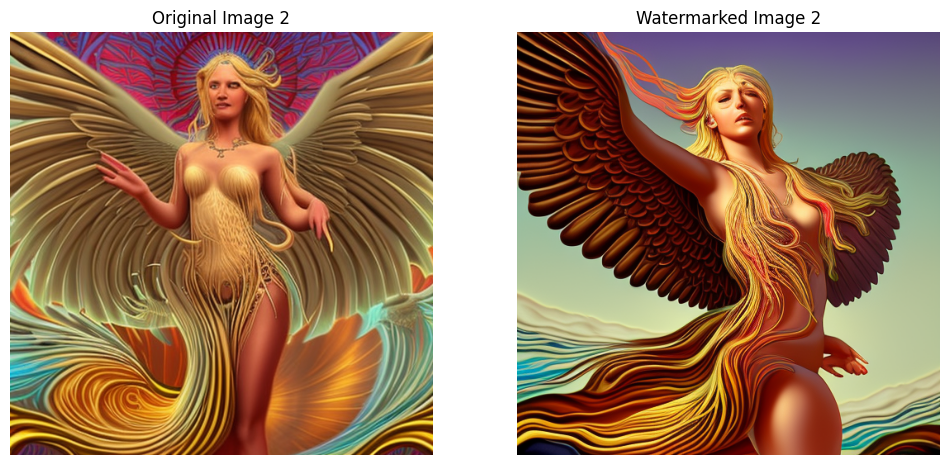

  0%|          | 0/50 [00:00<?, ?it/s]

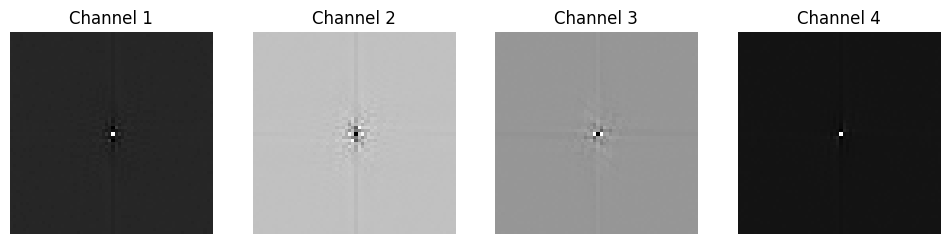

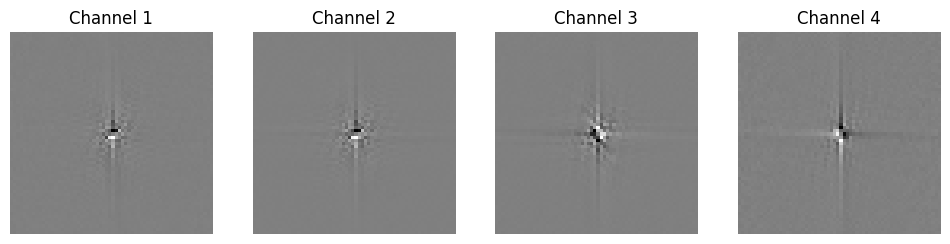

 20%|██        | 2/10 [01:35<06:22, 47.83s/it]

Sample 2/2 processed
Processing prompt 3: epic 3 d, become legend shiji! gpu mecha controlled by telepathic hackers, made of liquid, bubbles, crystals, and mangroves, houdini sidefx, perfect render, artstation trending, by jeremy mann, tsutomi nihei and ilya kuvshinov 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

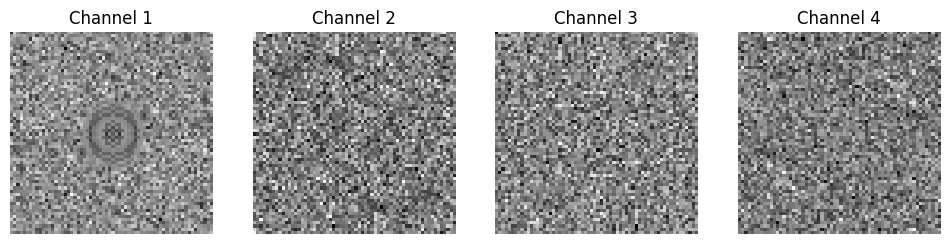

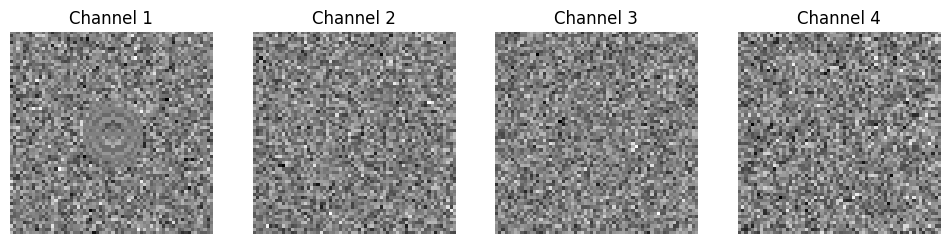

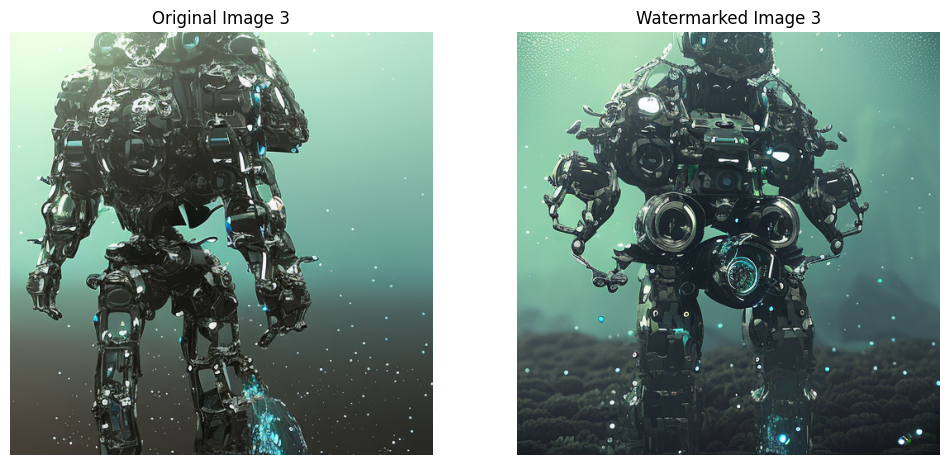

  0%|          | 0/50 [00:00<?, ?it/s]

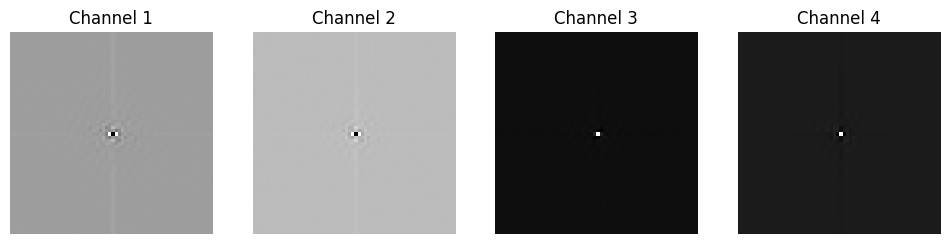

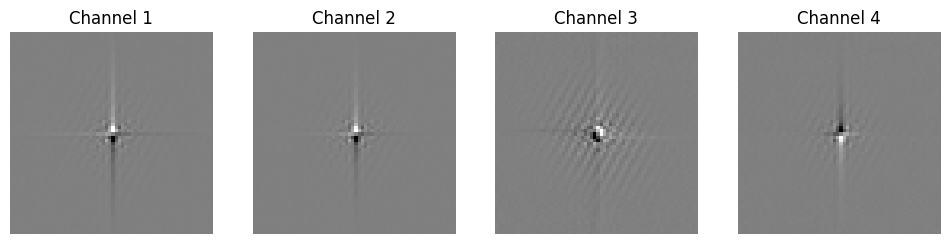

 30%|███       | 3/10 [02:23<05:34, 47.83s/it]

Sample 3/2 processed
Processing prompt 4: an airbrush painting of cyber war machine scene in area 5 1 by destiny womack, gregoire boonzaier, harrison fisher, richard dadd 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

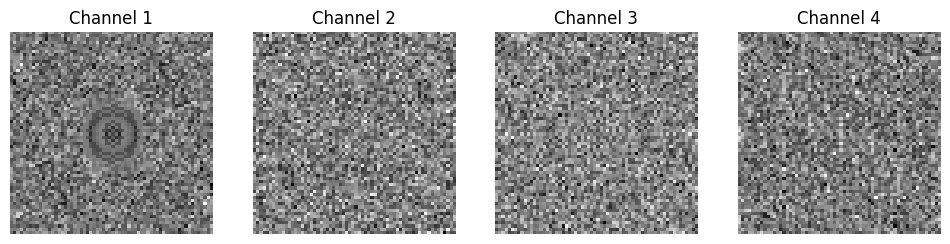

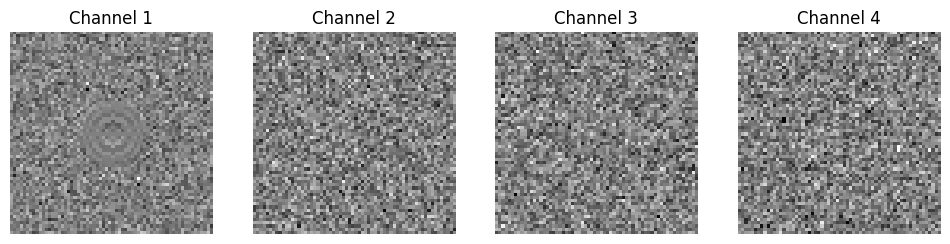

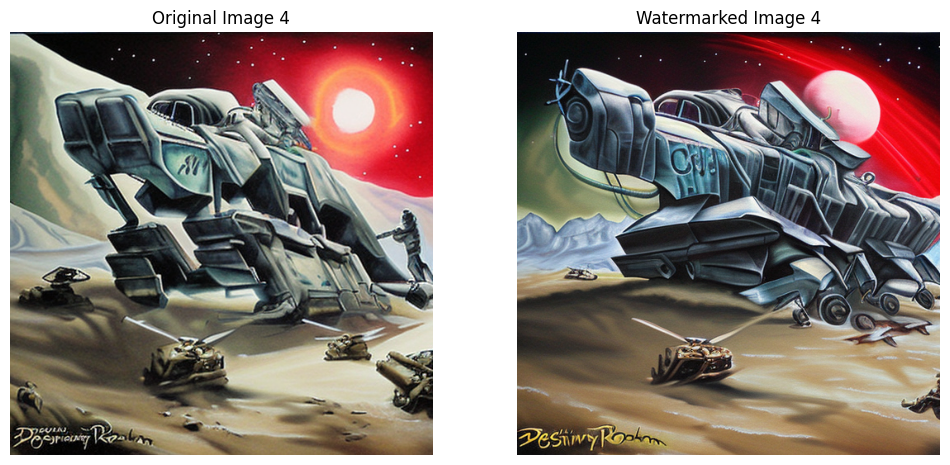

  0%|          | 0/50 [00:00<?, ?it/s]

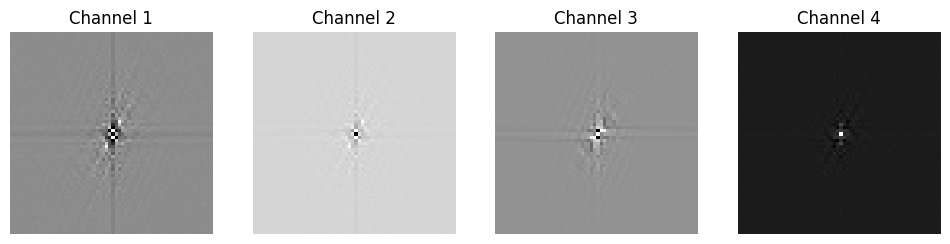

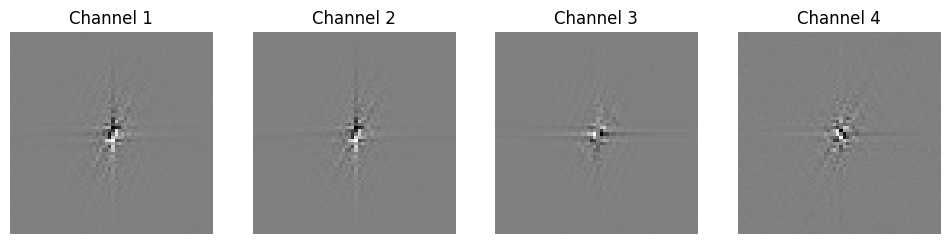

 40%|████      | 4/10 [03:11<04:46, 47.70s/it]

Sample 4/2 processed
Processing prompt 5: concept art of a silent hill monster. painted by edward hopper. 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

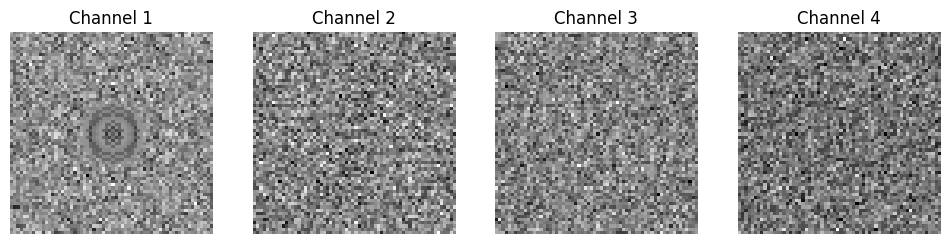

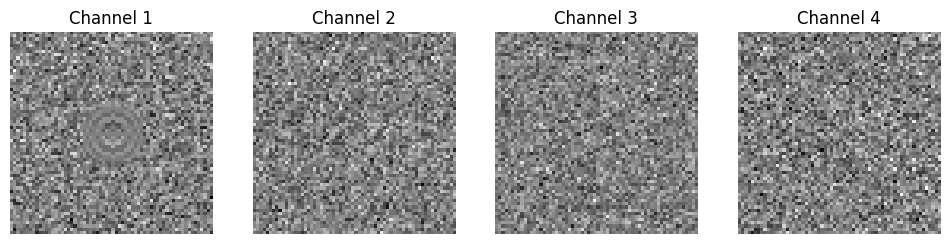

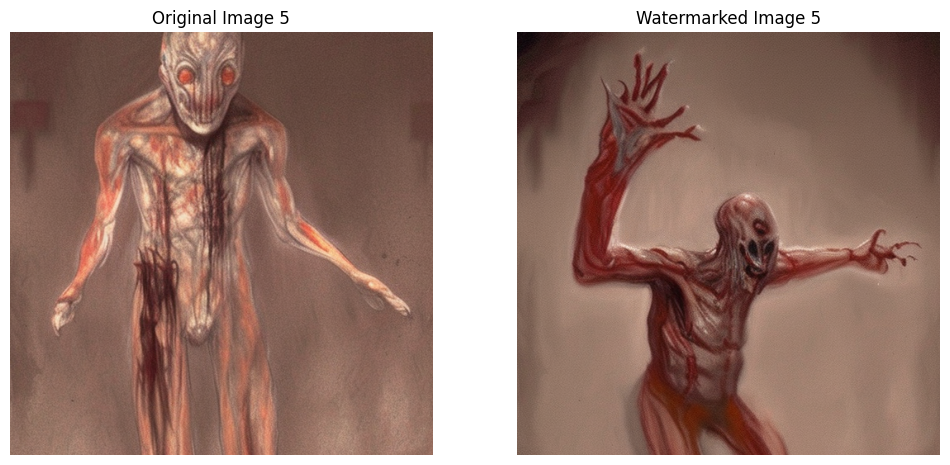

  0%|          | 0/50 [00:00<?, ?it/s]

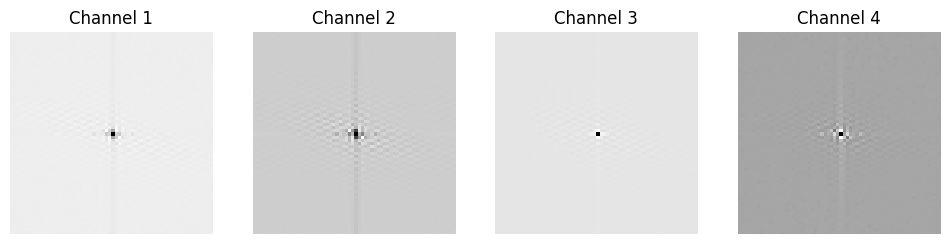

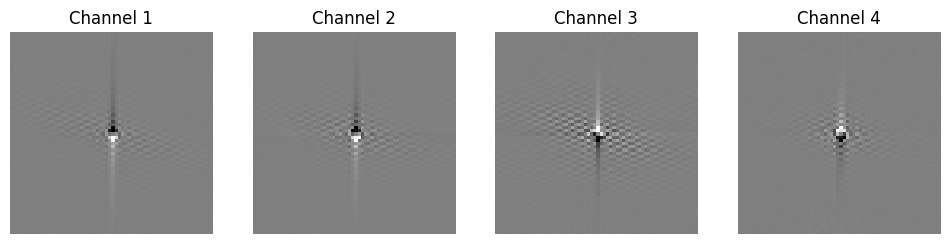

 50%|█████     | 5/10 [03:59<03:59, 47.98s/it]

Sample 5/2 processed
Processing prompt 6: a renaissance portrait of dwayne johnson, art in the style of rembrandt!! intricate. ultra detailed, oil on canvas, wet - on - wet technique, pay attention to facial details, highly realistic, cinematic lightning, intricate textures, illusionistic detail, 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

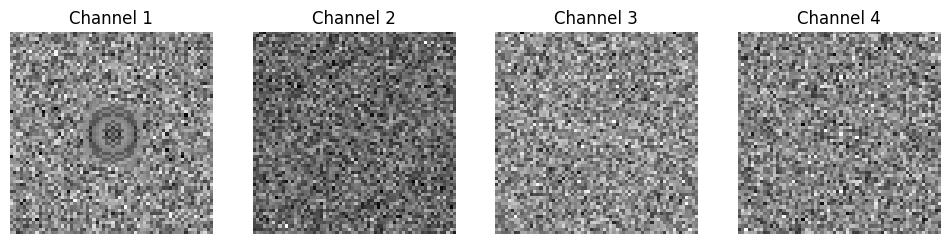

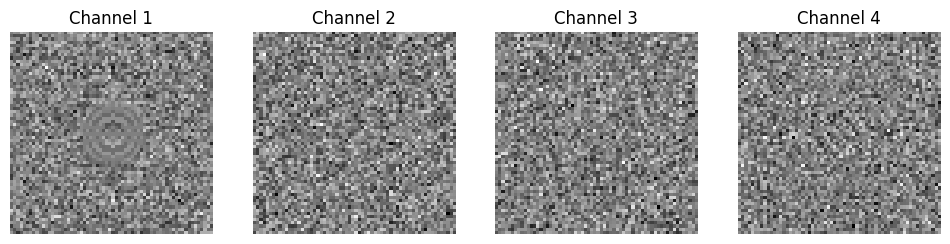

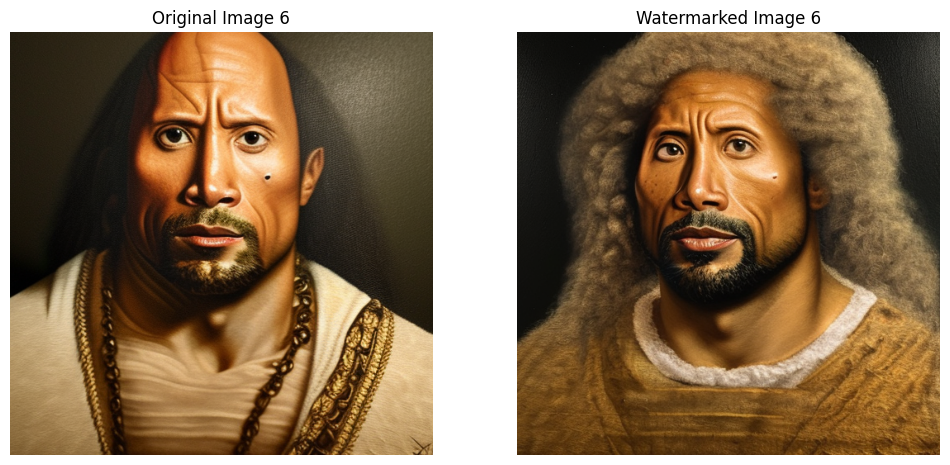

  0%|          | 0/50 [00:00<?, ?it/s]

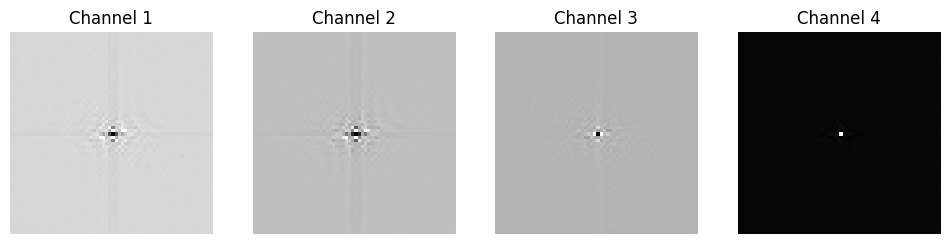

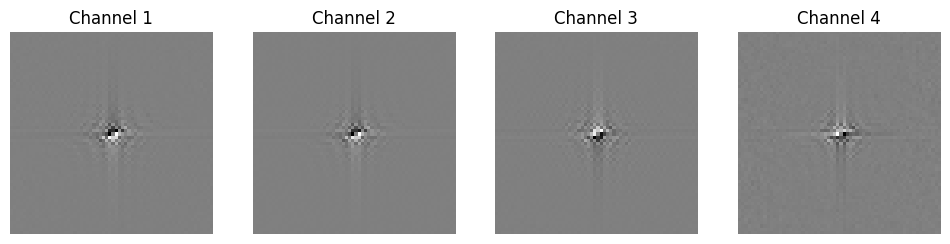

 60%|██████    | 6/10 [04:47<03:11, 47.89s/it]

Sample 6/2 processed
Processing prompt 7: portrait of a dancing eagle woman, beautiful blonde haired lakota sioux goddess, intricate, highly detailed art by james jean, ray tracing, digital painting, artstation, concept art, smooth, sharp focus, illustration, artgerm and greg rutkowski and alphonse mucha, vladimir kush, giger, roger dean, 8 k 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

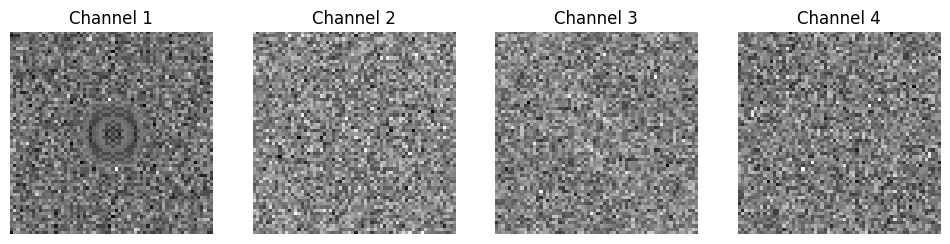

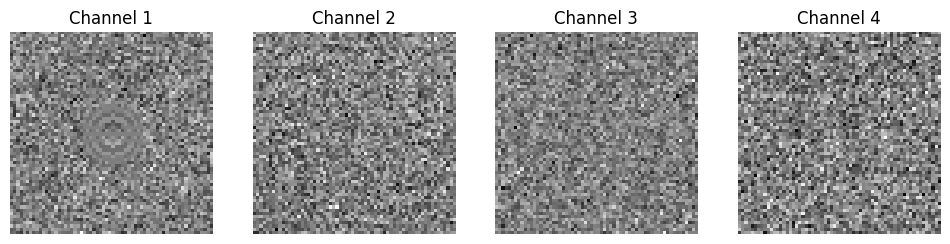

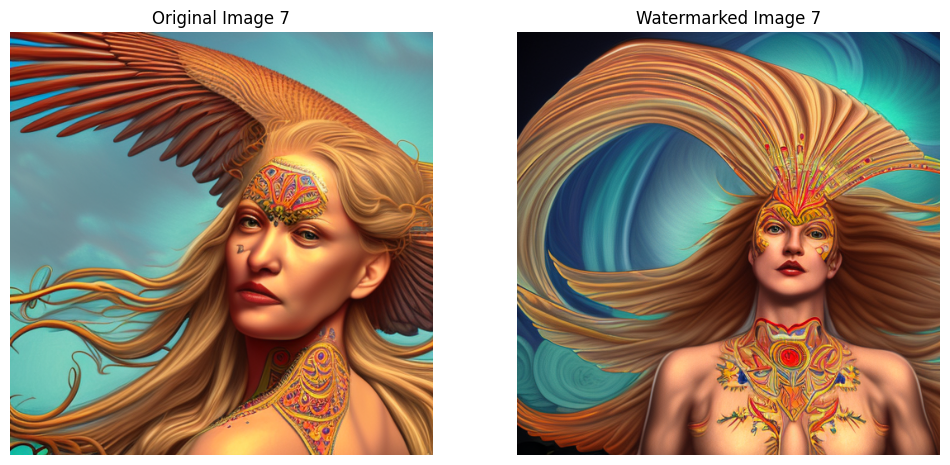

  0%|          | 0/50 [00:00<?, ?it/s]

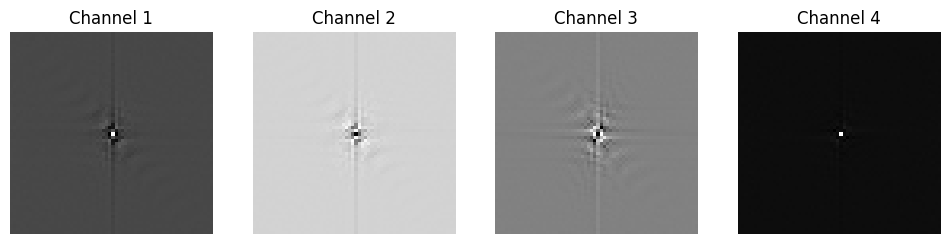

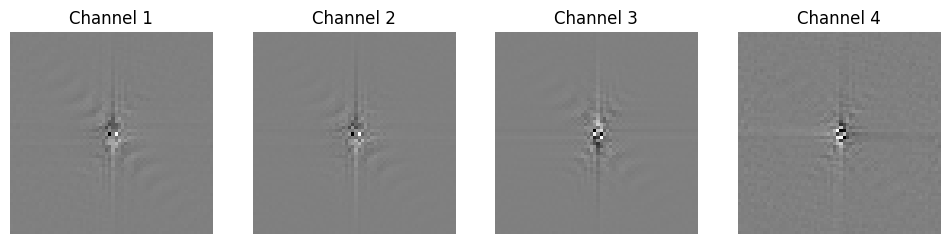

 70%|███████   | 7/10 [05:35<02:24, 48.06s/it]

Sample 7/2 processed
Processing prompt 8: a cigarette with purple tobacco 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

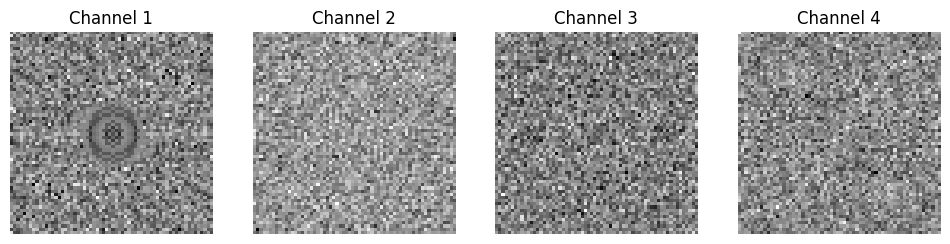

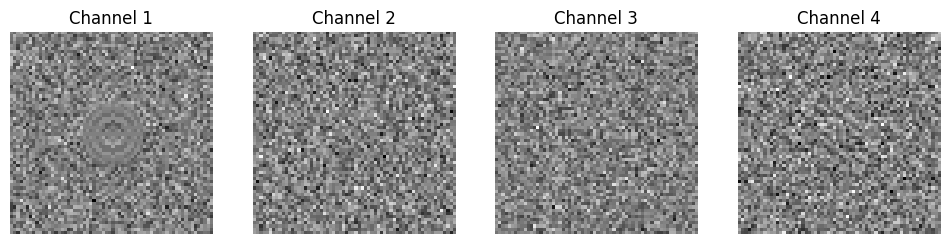

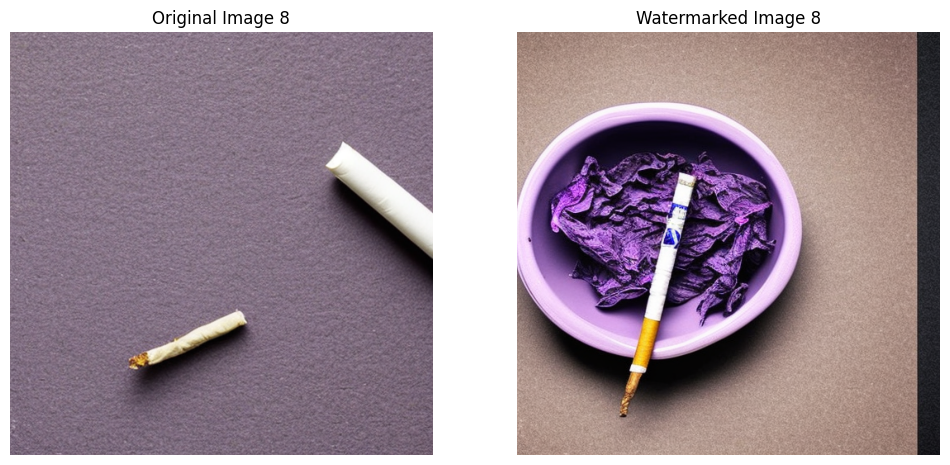

  0%|          | 0/50 [00:00<?, ?it/s]

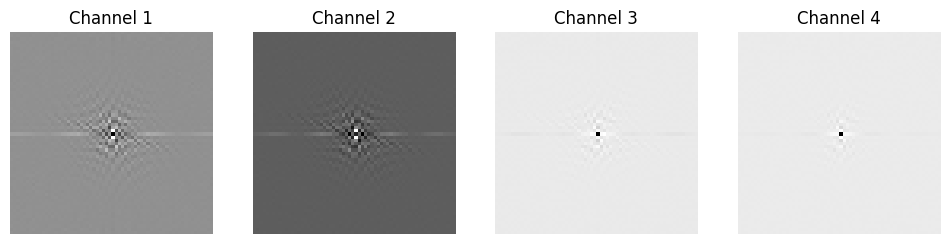

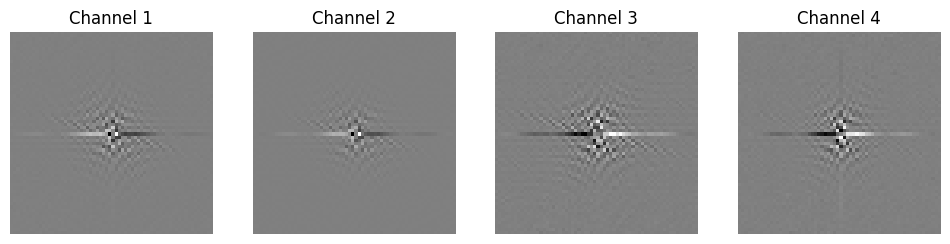

 80%|████████  | 8/10 [06:24<01:36, 48.22s/it]

Sample 8/2 processed
Processing prompt 9: photo of very unappetizing food 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

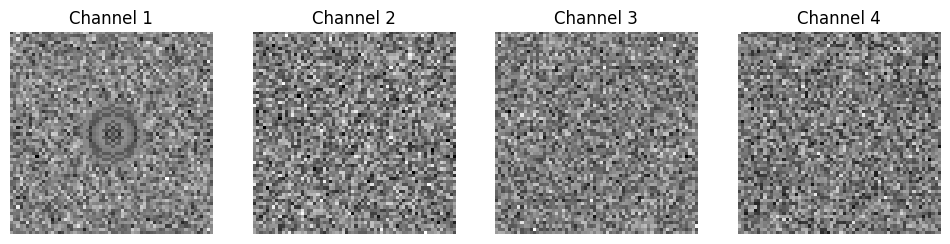

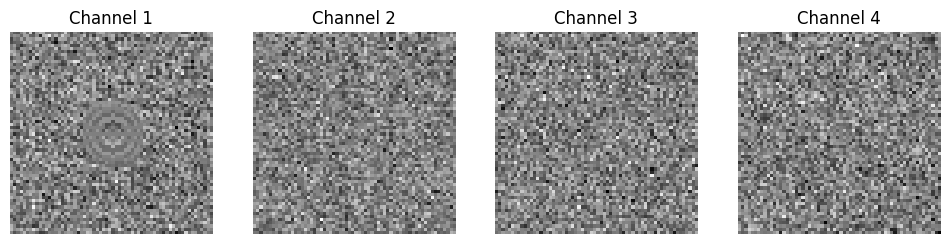

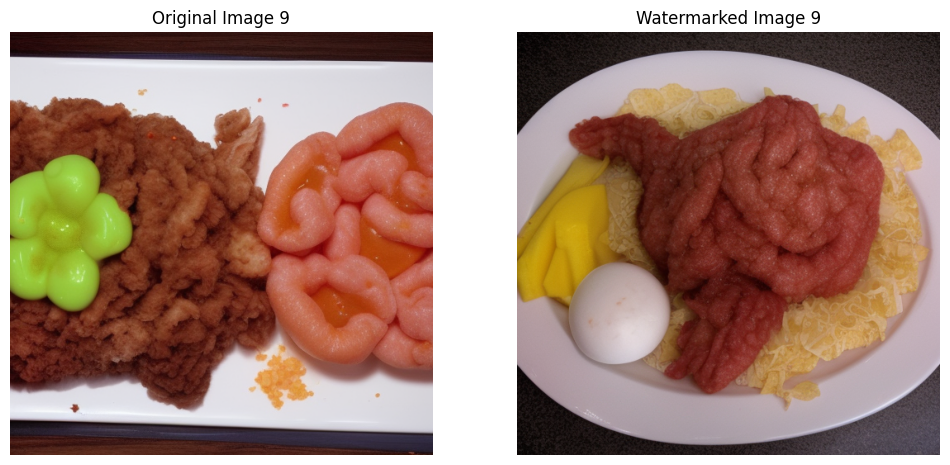

  0%|          | 0/50 [00:00<?, ?it/s]

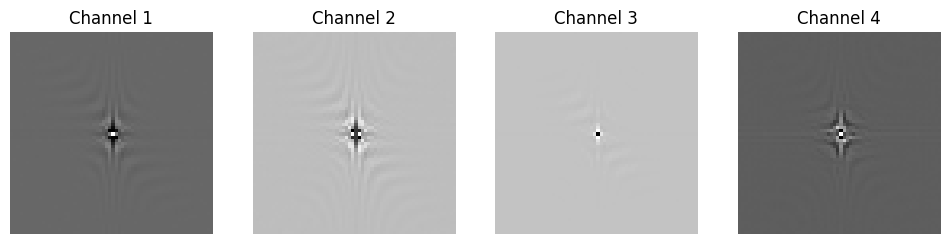

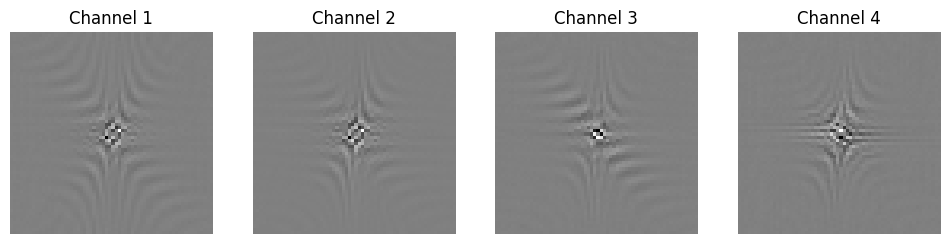

 90%|█████████ | 9/10 [07:12<00:48, 48.35s/it]

Sample 9/2 processed
Processing prompt 10: a renaissance portrait of will ferrell, art in the style of rembrandt!! intricate. ultra detailed, oil on canvas, wet - on - wet technique, pay attention to facial details, highly realistic, cinematic lightning, intricate textures, illusionistic detail, 


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

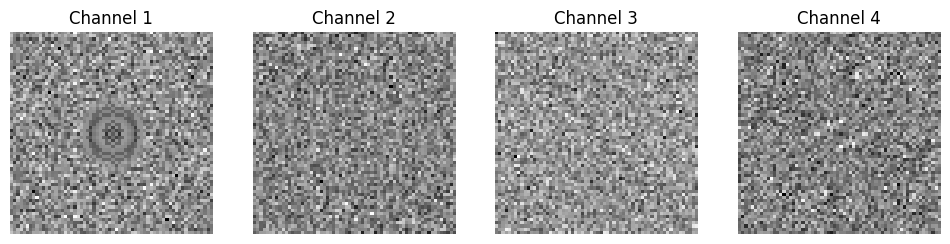

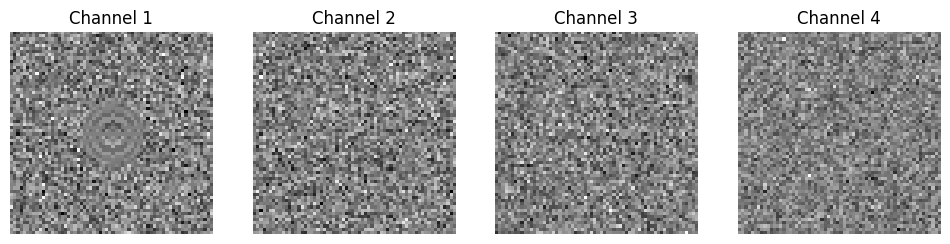

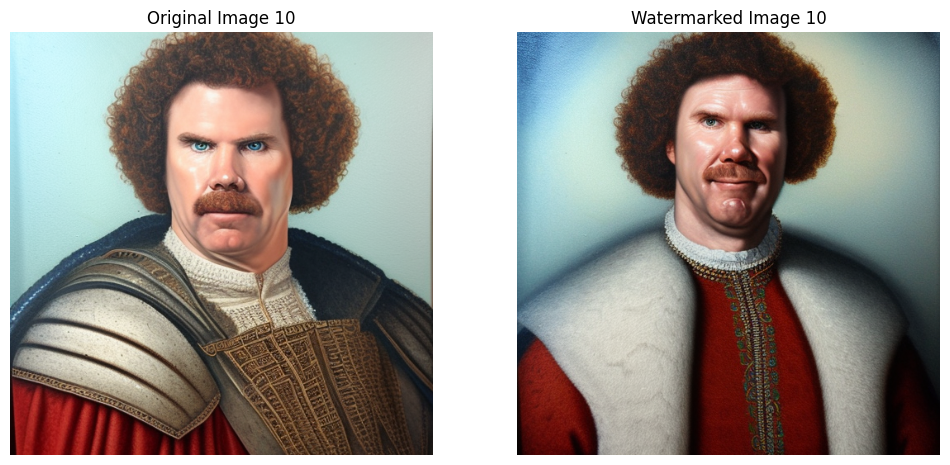

  0%|          | 0/50 [00:00<?, ?it/s]

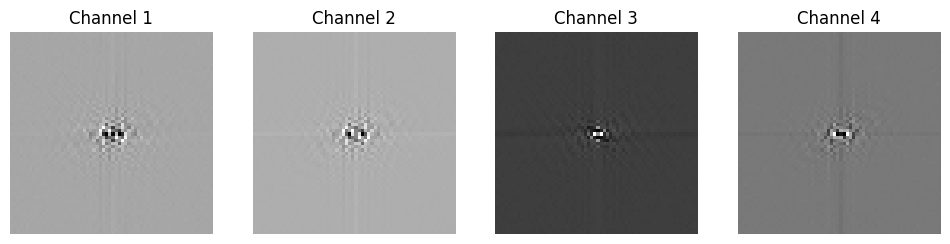

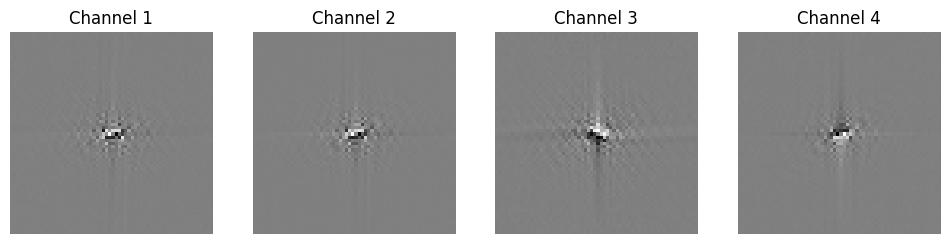

100%|██████████| 10/10 [08:02<00:00, 48.24s/it]

Sample 10/2 processed


In [ ]:
import argparse
import copy
import numpy as np
import torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from datasets import load_dataset
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler
import numpy as np
from sklearn.metrics import roc_curve, auc

def set_random_seed(seed):
    torch.manual_seed(seed)
    np.random.seed(seed)

def circle_mask(size=64, r=10, x_offset=0, y_offset=0):
    x0 = y0 = size // 2
    x0 += x_offset
    y0 += y_offset
    y, x = np.ogrid[:size, :size]
    y = y[::-1]
    return ((x - x0)**2 + (y-y0)**2) <= r**2

def get_watermarking_mask(init_latents_w, args, device):
    watermarking_mask = torch.zeros(init_latents_w.shape, dtype=torch.bool).to(device)
    if args.w_mask_shape == 'circle':
        np_mask = circle_mask(init_latents_w.shape[-1], r=args.w_radius)
        torch_mask = torch.tensor(np_mask).to(device)
        if args.w_channel == -1:
            watermarking_mask[:, :] = torch_mask
        else:
            watermarking_mask[:, args.w_channel] = torch_mask
    elif args.w_mask_shape == 'square':
        anchor_p = init_latents_w.shape[-1] // 2
        if args.w_channel == -1:
            watermarking_mask[:, :, anchor_p-args.w_radius:anchor_p+args.w_radius, anchor_p-args.w_radius:anchor_p+args.w_radius] = True
        else:
            watermarking_mask[:, args.w_channel, anchor_p-args.w_radius:anchor_p+args.w_radius, anchor_p-args.w_radius:anchor_p+args.w_radius] = True
    elif args.w_mask_shape == 'no':
        pass
    return watermarking_mask

def get_watermarking_pattern(pipe, args, device, shape=None):
    set_random_seed(args.w_seed)
    if shape is not None:
        gt_init = torch.randn(*shape, device=device)
    else:
        gt_init = pipe.get_random_latents()

    if 'seed_ring' in args.w_pattern:
        gt_patch = gt_init
        gt_patch_tmp = copy.deepcopy(gt_patch)
        for i in range(args.w_radius, 0, -1):
            tmp_mask = circle_mask(gt_init.shape[-1], r=i)
            tmp_mask = torch.tensor(tmp_mask).to(device)
            for j in range(gt_patch.shape[1]):
                gt_patch[:, j, tmp_mask] = gt_patch_tmp[0, j, 0, i].item()
    elif 'seed_zeros' in args.w_pattern:
        gt_patch = gt_init * 0
    elif 'seed_rand' in args.w_pattern:
        gt_patch = gt_init
    elif 'rand' in args.w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2))
        gt_patch[:] = gt_patch[0]
    elif 'zeros' in args.w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2)) * 0
    elif 'const' in args.w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2)) * 0
        gt_patch += args.w_pattern_const
    elif 'ring' in args.w_pattern:
        gt_patch = torch.fft.fftshift(torch.fft.fft2(gt_init), dim=(-1, -2))
        gt_patch_tmp = copy.deepcopy(gt_patch)
        for i in range(args.w_radius, 0, -1):
            tmp_mask = circle_mask(gt_init.shape[-1], r=i)
            tmp_mask = torch.tensor(tmp_mask).to(device)
            for j in range(gt_patch.shape[1]):
                gt_patch[:, j, tmp_mask] = gt_patch_tmp[0, j, 0, i].item()
    return gt_patch

def inject_watermark(init_latents_w, watermarking_mask, gt_patch, args):
    init_latents_w_fft = torch.fft.fftshift(torch.fft.fft2(init_latents_w), dim=(-1, -2))
    if args.w_injection == 'complex':
        init_latents_w_fft[watermarking_mask] = gt_patch[watermarking_mask].clone()
    elif args.w_injection == 'seed':
        init_latents_w[watermarking_mask] = gt_patch[watermarking_mask].clone()
        return init_latents_w
    init_latents_w = torch.fft.ifft2(torch.fft.ifftshift(init_latents_w_fft, dim=(-1, -2))).real
    return init_latents_w

def visualize_tensor(tensor, name='./tmp.png'):
    channels = tensor.squeeze(0).cpu().numpy()
    fig, axs = plt.subplots(1, 4, figsize=(12, 3))
    for i, ax in enumerate(axs):
        ax.imshow(channels[i], cmap='gray')
        ax.set_title(f'Channel {i+1}')
        ax.axis('off')
    plt.savefig(name)
    plt.show()



diffusion_db = load_dataset('poloclub/diffusiondb', '2m_first_5k', trust_remote_code=True)
prompts = diffusion_db['train']['prompt']

model_id = 'stabilityai/stable-diffusion-2-1-base'
device = 'cuda' if torch.cuda.is_available() else 'cpu'

scheduler = DPMSolverMultistepScheduler.from_pretrained(model_id, subfolder='scheduler')
pipe = DiffusionPipeline.from_pretrained(model_id, scheduler=scheduler, torch_dtype=torch.float16)
pipe = pipe.to(torch.float32)
pipe = pipe.to(device)

args = argparse.Namespace(
    w_mask_shape='circle',
    w_radius=5,
    w_channel=0,
    w_pattern='rand',
    w_seed=42,
    w_injection='complex',
    num_images=1,
    guidance_scale=7.5,
    num_inference_steps=50,
    image_length=512,
    test_num_inference_steps=50,
    start=0,
    end=10
)

shape = (1, 4, 64, 64)
gt_patch = get_watermarking_pattern(pipe, args, device, shape)

watermarked_scores = []
clean_scores = []
y_true = []

n_samples = 2
for i in tqdm(range(args.start, args.end)):
    seed = i + 42 
    current_prompt = prompts[i]

    print(f"Processing prompt {i+1}: {current_prompt}")

    # Generation without watermarking
    set_random_seed(seed)
    init_latents_no_w = torch.randn(shape, device=device)
    with torch.autocast("cuda"):
        outputs_no_w = pipe(
            current_prompt,
            num_images_per_prompt=args.num_images,
            guidance_scale=args.guidance_scale,
            num_inference_steps=args.num_inference_steps,
            height=args.image_length,
            width=args.image_length,
            latents=init_latents_no_w,
        )
    orig_image_no_w = outputs_no_w.images[0]

    # Generation with watermarking
    init_latents_w = init_latents_no_w.clone()
    watermarking_mask = get_watermarking_mask(init_latents_w, args, device)
    init_latents_w = inject_watermark(init_latents_w, watermarking_mask, gt_patch, args)

    outputs_w = pipe(
        current_prompt,
        num_images_per_prompt=args.num_images,
        guidance_scale=args.guidance_scale,
        num_inference_steps=args.num_inference_steps,
        height=args.image_length,
        width=args.image_length,
        latents=init_latents_w,
    )
    orig_image_w = outputs_w.images[0]

    orig_image_no_w.save(f'original_image_{i}.png')
    orig_image_w.save(f'watermarked_image_{i}.png')

    init_latents_w_fft_real = torch.fft.fftshift(torch.fft.fft2(init_latents_w), dim=(-1, -2)).real
    visualize_tensor(init_latents_w_fft_real, name=f'./real_{i}.png')
    init_latents_w_fft_imag = torch.fft.fftshift(torch.fft.fft2(init_latents_w), dim=(-1, -2)).imag
    visualize_tensor(init_latents_w_fft_imag, name=f'./imag_{i}.png')

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    ax1.imshow(orig_image_no_w)
    ax1.set_title(f'Original Image {i+1}')
    ax1.axis('off')

    ax2.imshow(orig_image_w)
    ax2.set_title(f'Watermarked Image {i+1}')
    ax2.axis('off')

    plt.savefig(f'comparison_{i}.png')
    plt.show()


    img_w = _transform_img(orig_image_w).unsqueeze(0).to(pipe.unet.dtype).to(device)
    image_latents_w = pipe.vae.encode(img_w).latent_dist.mode() * 0.18215

    reversed_latents_w = pipe(
        prompt='',
        latents=image_latents_w,
        guidance_scale=1,
        num_inference_steps=args.test_num_inference_steps,
        output_type='latent',
    ).images.float().cpu()

    init_latents_w_fft_real = torch.fft.fftshift(torch.fft.fft2(reversed_latents_w), dim=(-1, -2)).real
    visualize_tensor(init_latents_w_fft_real, name='./real.png')

    init_latents_w_fft_imag = torch.fft.fftshift(torch.fft.fft2(reversed_latents_w), dim=(-1, -2)).imag
    visualize_tensor(init_latents_w_fft_imag, name='./imag.png')

    print(f'Sample {i+1}/{n_samples} processed')



In [17]:
print("For the Det-IGEN model with radius of the watermark as 5:\n\n")

print("---------------- TASK 1: DETECTING AI-GENERATED IMAGES --------------\n")
print("Here, we evaluate the performance of our detecting approach on a mix of generated images, both with and without the watermark:")
print(f"Accuracy: {acc_gen}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {2 * (precision * recall) / (precision + recall)}\n")

tn_irl, fp_irl = 100-sum2, sum2

acc_irl = (tp_wmk_wmk+tn_irl)/(tp_wmk_wmk+fn_nwmk_wmk+tn_irl+fp_irl)
rec_irl = tp_wmk_wmk/(tp_wmk_wmk+fn_nwmk_wmk)
prec_irl = tp_wmk_wmk/(tp_wmk_wmk+fp_irl)

print("---------------- TASK 2: REAL-WORLD IMAGE CLASSIFICATION --------------\n")
print("Here, we record our detecting approach on a mix of watermark-generated images and real-world images (a real-world classification case):")
print(f"Accuracy: {acc_irl}")
print(f"Precision: {prec_irl}")
print(f"Recall: {rec_irl}")
print(f"F1 Score: {2 * (prec_irl * rec_irl) / (prec_irl + rec_irl)}\n")


For the Det-IGEN model with radius of the watermark as 5:


---------------- TASK 1: DETECTING AI-GENERATED IMAGES --------------

Here, we evaluate the performance of our detecting approach on a mix of generated images, both with and without the watermark:
Accuracy: 0.995
Precision: 0.9900990099009901
Recall: 1.0
F1 Score: 0.9950248756218906

---------------- TASK 2: REAL-WORLD IMAGE CLASSIFICATION --------------

Here, we record our detecting approach on a mix of watermark-generated images and real-world images (a real-world classification case):
Accuracy: 1.0
Precision: 1.0
Recall: 1.0
F1 Score: 1.0

